# Import modules

In [ ]:
!pip install albumentations

In [ ]:
!pip install catboost

In [9]:
import glob
import os
from pathlib import Path
import random
from random import shuffle
import shutil
from tqdm import tqdm
import warnings

import albumentations as A
from catboost import CatBoostClassifier
import matplotlib.pyplot as plt
import numpy as np
from osgeo import gdal
import rasterio
from sklearn.metrics import jaccard_score
from sklearn.model_selection import *
from sklearn.model_selection import StratifiedKFold
import pandas as pd

warnings.filterwarnings('ignore')

In [19]:
metadata = Path.cwd().parent / "training_data" / "flood-training-metadata.csv"
train_features = Path.cwd().parent / "training_data" / "train_features"
train_labels = Path.cwd().parent / "training_data" / "train_labels"

# Load data

In [15]:
meta = pd.read_csv(metadata)
meta = meta.drop_duplicates('chip_id').reset_index(drop=True)

In [16]:
location_chips = meta.groupby('location').chip_id.unique()
print('Number of countries:', location_chips.shape[0])
print('Number of images in the train:', meta.chip_id.nunique())

Number of countries: 13
Number of images in the train: 542


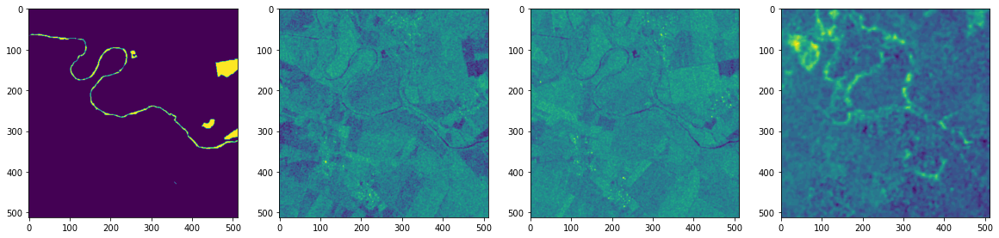

In [21]:
filenames = [x.split('.')[0] for x in os.listdir(train_labels)]

for fn in filenames[17:18]:
    
    with rasterio.open(train_features / '{}_vv.tif'.format(fn)) as fvv:
        vv = fvv.read(1)
    with rasterio.open(train_features / '{}_vh.tif'.format(fn)) as fvh:
        vh = fvh.read(1)
    with rasterio.open(train_features / '{}_nasadem.tif'.format(fn)) as nasadem_:
        nasadem = nasadem_.read(1)
    with rasterio.open(train_labels / '{}.tif'.format(fn)) as fmask:
        mask = fmask.read(1)
        
    _, ax = plt.subplots(1, 4, figsize=(20, 6))
    ax[0].imshow(mask)
    ax[1].imshow(vh)
    ax[2].imshow(vv)
    ax[3].imshow(nasadem)
    plt.show()

# Data process functions

The value 255 means empty zones in the photo. I convert them to zeros.

In [22]:
def process_mask(mask):
    mask_temp = mask.copy()
    mask_temp[mask == 255] = 0
    return mask_temp

Resizing augmentations help reduce the dimensionality of the data. But best models were made without dimension reduction.

In [23]:
def augment_image(image, mask):

    aug = A.Compose([
        
        A.OneOf([
            A.Resize(512, 512, p=0.35),
            A.Resize(256, 256, p=0.45),
            A.Resize(128, 128, p=0.55),
            A.Resize(64, 64, p=0.65)
        ], p=1)
    
    ])

    augmented = aug(image=image, mask=mask)

    return augmented['image'], augmented['mask']

Function that translates one image into a table.

In [28]:
def get_one(path):
    
    with rasterio.open(train_features / '{}_vv.tif'.format(path)) as fvv:
        vv = fvv.read(1)
    with rasterio.open(train_features / '{}_vh.tif'.format(path)) as fvh:
        vh = fvh.read(1)
    
    with rasterio.open(train_features / '{}_nasadem.tif'.format(path)) as nasadem_:
        nasadem = nasadem_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-change.tif'.format(path)) as jrc_gsw_change_:
        jrc_gsw_change = jrc_gsw_change_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-extent.tif'.format(path)) as jrc_gsw_extent_:
        jrc_gsw_extent = jrc_gsw_extent_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-occurrence.tif'.format(path)) as jrc_gsw_occurrence_:
        jrc_gsw_occurrence = jrc_gsw_occurrence_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-recurrence.tif'.format(path)) as jrc_gsw_recurrence_:
        jrc_gsw_recurrence = jrc_gsw_recurrence_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-seasonality.tif'.format(path)) as jrc_gsw_seasonality_:
        jrc_gsw_seasonality = jrc_gsw_seasonality_.read(1)
    with rasterio.open(train_features / '{}_jrc-gsw-transitions.tif'.format(path)) as jrc_gsw_transitions_:
        jrc_gsw_transitions = jrc_gsw_transitions_.read(1)
    
    with rasterio.open(train_labels / '{}.tif'.format(path)) as fmask:
        mask = process_mask(fmask.read(1))
                            
    temp = pd.DataFrame()

    temp['vh'] = vv.flatten()
    temp['vv'] = vh.flatten()
    temp['nasadem'] = nasadem.flatten()
    temp['jrc_gsw_change'] = jrc_gsw_change.flatten()
    temp['jrc_gsw_occurrence'] = jrc_gsw_occurrence.flatten()
    temp['jrc_gsw_extent'] = jrc_gsw_extent.flatten()
    temp['jrc_gsw_recurrence'] = jrc_gsw_recurrence.flatten()
    temp['jrc_gsw_seasonality'] = jrc_gsw_seasonality.flatten()
    temp['jrc_gsw_transitions'] = jrc_gsw_transitions.flatten()
    
    temp['y'] = mask.flatten()
    
    return temp

Function that concatenates tables for a single image into one big table.

In [29]:
def get_data(chips, augment=True):
    data = pd.DataFrame()
    for path in tqdm(chips):
        data = pd.concat([data, get_one(path)], ignore_index=True)
    return data

# CatBoostClassifier sample

In [30]:
train = get_data(filenames[:50])

100%|██████████| 50/50 [00:05<00:00,  8.73it/s]


In [31]:
print('Train shape:', train.shape)

Train shape: (13107200, 10)


In [32]:
train.head()

,vh,vv,nasadem,jrc_gsw_change,jrc_gsw_occurrence,jrc_gsw_extent,jrc_gsw_recurrence,jrc_gsw_seasonality,jrc_gsw_transitions,y
0,-9.934231,-12.418521,135,150,1,1,11,0,10,0
1,-10.041442,-11.831090,135,150,1,1,11,0,10,0
2,-10.635961,-12.210486,134,150,1,1,11,0,10,0
3,-11.889838,-13.600997,134,150,1,1,11,0,10,0
4,-12.400304,-12.763346,134,150,1,1,11,0,10,0


In [33]:
X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                  test_size=0.15, stratify=train['y'])

In [34]:
model = CatBoostClassifier(iterations=1000, verbose=100, early_stopping_rounds=100)
model.fit(X_train, y_train, eval_set=(X_val, y_val))

Learning rate set to 0.316592
0:	learn: 0.2986724	test: 0.2974201	best: 0.2974201 (0)	total: 749ms	remaining: 12m 27s
100:	learn: 0.1192279	test: 0.1191126	best: 0.1191126 (100)	total: 1m 6s	remaining: 9m 50s
200:	learn: 0.1173443	test: 0.1173622	best: 0.1173622 (200)	total: 2m 11s	remaining: 8m 42s
300:	learn: 0.1163417	test: 0.1164373	best: 0.1164373 (300)	total: 3m 17s	remaining: 7m 37s
400:	learn: 0.1158108	test: 0.1159761	best: 0.1159761 (400)	total: 4m 22s	remaining: 6m 31s
500:	learn: 0.1152627	test: 0.1155173	best: 0.1155173 (500)	total: 5m 28s	remaining: 5m 26s
600:	learn: 0.1148284	test: 0.1151630	best: 0.1151630 (600)	total: 6m 34s	remaining: 4m 21s
700:	learn: 0.1147843	test: 0.1151225	best: 0.1151225 (612)	total: 7m 31s	remaining: 3m 12s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.1151225409
bestIteration = 612

Shrink model to first 613 iterations.


In [35]:
jaccard_score(y_val, model.predict(X_val))

0.6634020478767709

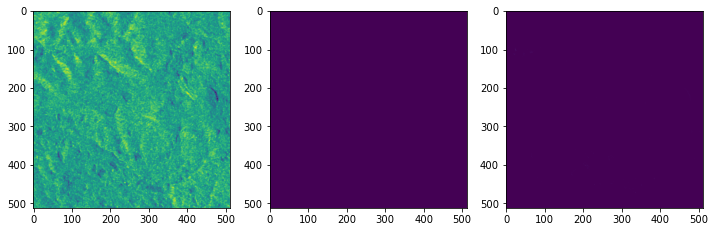

In [36]:
test_one = get_one(filenames[60])
_, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(np.array(test_one['vh']).reshape((512, 512)))
ax[1].imshow(np.array(test_one['y']).reshape((512, 512)), vmin=0, vmax=1)
ax[2].imshow(model.predict_proba(test_one)[:, -1].reshape((512, 512)), vmin=0, vmax=1)
plt.show()

In [37]:
fip = pd.DataFrame()
fip['col'] = X_train.columns
fip['val'] = model.get_feature_importance()
fip = fip.sort_values('val', ascending=False)
fip

,col,val
2,nasadem,48.635462
1,vv,22.917876
0,vh,12.387017
4,jrc_gsw_occurrence,8.251104
6,jrc_gsw_recurrence,3.230927
3,jrc_gsw_change,1.831647
8,jrc_gsw_transitions,1.428863
7,jrc_gsw_seasonality,1.263565
5,jrc_gsw_extent,0.053540


**Tentative conclusion:**

> If you look for works on mathematical methods for determining flooding, you can see formulas that allow you to find flooding pixel by pixel. This suggests the idea of using pixel-by-pixel prediction by gradient boosting.

> This method works. Maybe even not bad)

> Nasadem is very important feature. And this is not surprising, because if you think about the physical sense, the lower the elevation, the higher the chance of flooding.

# Stratified models

Unfortunately, I didn't have much computing power, so I took a test (smaller) part from the StratifiedKFold. And then divided it into training and validation samples.

Stratification was performed based on location. EDA shows that the degree of flooding correlates with the location.

## EDA of flooding

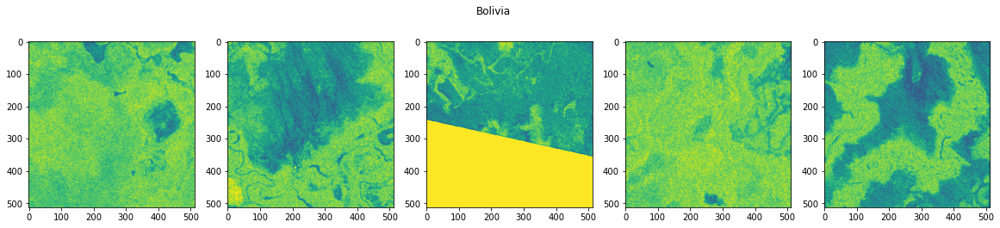

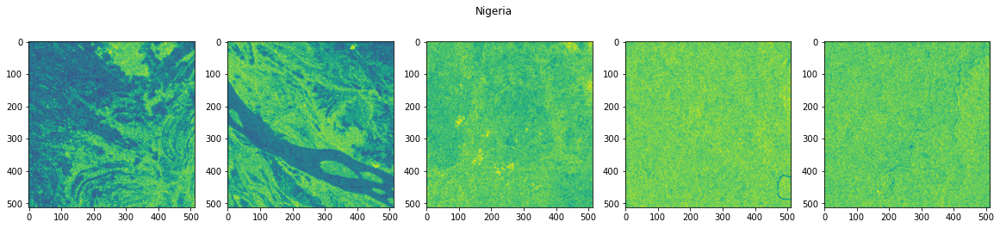

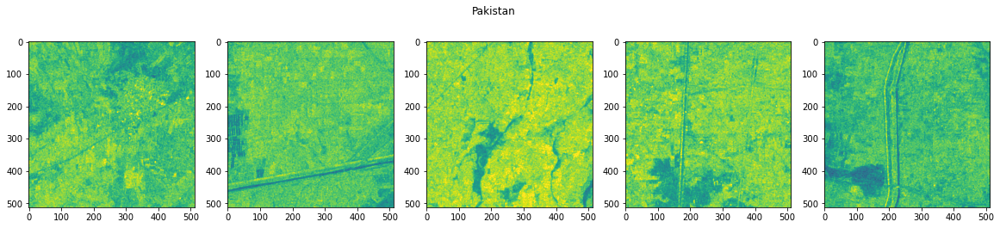

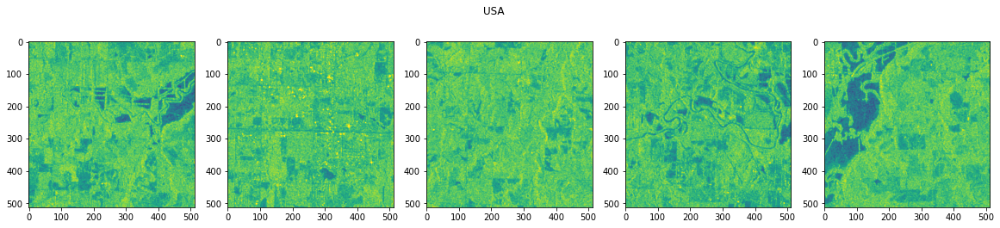

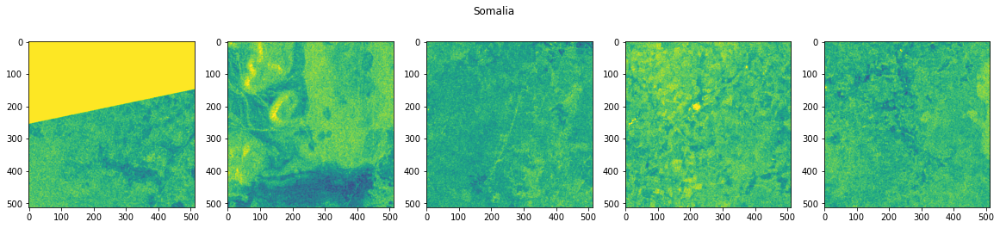

...

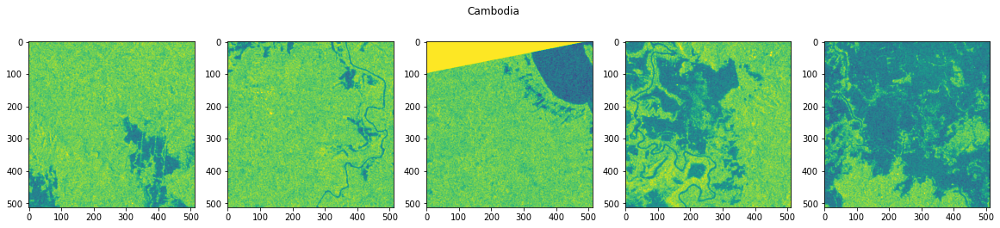

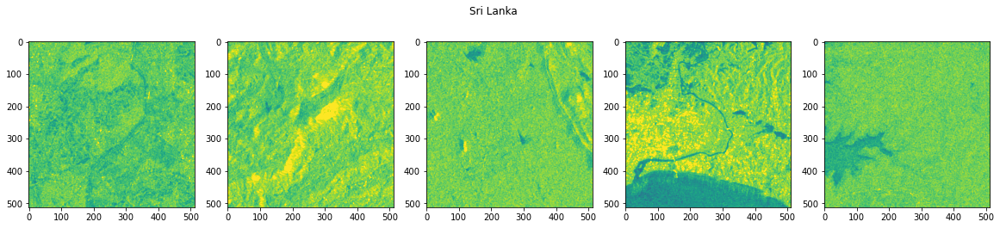

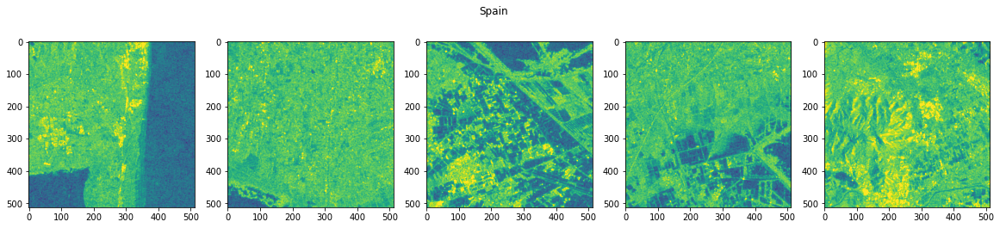

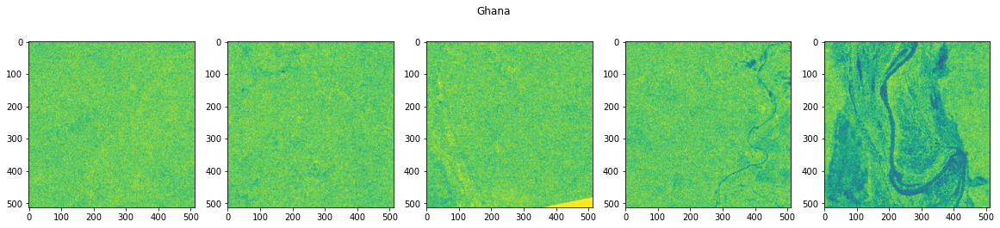

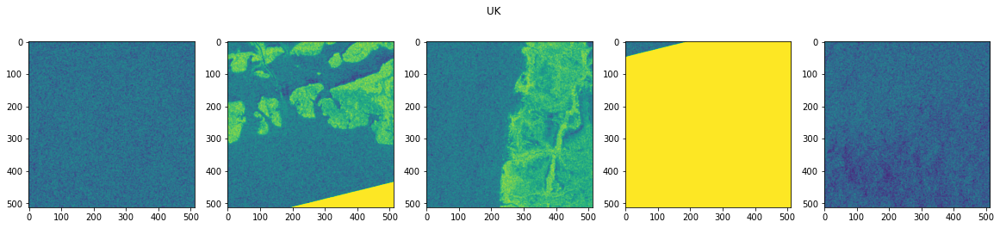

In [39]:
for loc in meta.location.unique():
    
    paths = meta[meta.location == loc].sample(5).chip_id.iloc[:]
    
    _, ax = plt.subplots(1, 5, figsize=(20, 4))
    
    for i, path in enumerate(paths):
        
        with rasterio.open(train_features / '{}_vv.tif'.format(path)) as fvv:
            vv = fvv.read(1)
        
        ax[i].imshow(vv, vmin=-37, vmax=0)
    
    plt.suptitle(loc)

In [43]:
all_masks = []
locate = []
floodly = []
pathly = []

for loc in tqdm(meta.location.unique()):
    
    paths = meta[meta.location == loc].chip_id.values
    
    for i, path in enumerate(paths):

        mask = process_mask(gdal.Open(str(train_labels / '{}.tif'.format(path))).ReadAsArray())
        
        all_masks.append(mask)
        locate.append(loc)
        floodly.append(mask.sum() / (512*512))
        pathly.append(path)
        
flood_eda = pd.DataFrame()
flood_eda['path'] = pathly
flood_eda['location'] = locate
flood_eda['floodly'] = floodly

100%|██████████| 13/13 [00:00<00:00, 24.89it/s]


In [44]:
flood_eda.groupby('location').floodly.describe().sort_values('mean')

,count,mean,std,min,25%,50%,75%,max
location,,,,,,,,
Slovakia,65.0,0.018061,0.045572,0.000000,0.000000,0.002762,0.009850,0.309711
USA,69.0,0.045430,0.067134,0.000629,0.007526,0.013943,0.065514,0.324692
Somalia,26.0,0.051354,0.063737,0.000000,0.000000,0.022242,0.105273,0.224854
Ghana,53.0,0.062545,0.156755,0.000000,0.000000,0.002308,0.023003,0.760483
Pakistan,28.0,0.080402,0.121815,0.000000,0.000318,0.022778,0.087570,0.397087
Paraguay,66.0,0.120797,0.164953,0.000000,0.003574,0.039627,0.185753,0.643555
Sri Lanka,42.0,0.123861,0.213094,0.000000,0.010920,0.058449,0.159247,0.981300
Spain,30.0,0.137300,0.190589,0.000904,0.012286,0.052517,0.233992,0.809994
India,68.0,0.142401,0.157759,0.000000,0.020671,0.079449,0.197027,0.648365


## Sequential sampling

In [49]:
Path("sequential_models").mkdir(parents=True, exist_ok=True)

In [50]:
k = 0

for i in range(0, 542, 68):
    
    fns = filenames[i:i+68]

    train = get_data(fns)

    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)

    model.save_model('sequential_models/model{}'.format(k))
    k += 1

    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

100%|██████████| 68/68 [00:04<00:00, 15.04it/s]


Learning rate set to 0.341574
0:	learn: 0.2898033	test: 0.2896679	best: 0.2896679 (0)	total: 1s	remaining: 16m 40s
250:	learn: 0.1196697	test: 0.1201168	best: 0.1201168 (250)	total: 3m 44s	remaining: 11m 9s
500:	learn: 0.1181949	test: 0.1188067	best: 0.1188067 (500)	total: 7m 30s	remaining: 7m 28s
750:	learn: 0.1178850	test: 0.1185477	best: 0.1185477 (580)	total: 10m 47s	remaining: 3m 34s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.1185476655
bestIteration = 580

Shrink model to first 581 iterations.

Jaccard on local val: 0.6339564051134579




100%|██████████| 68/68 [00:08<00:00,  8.47it/s]


Learning rate set to 0.341574
0:	learn: 0.2737087	test: 0.2731955	best: 0.2731955 (0)	total: 968ms	remaining: 16m 7s
250:	learn: 0.1000828	test: 0.1004696	best: 0.1004696 (250)	total: 3m 44s	remaining: 11m 11s
500:	learn: 0.0991614	test: 0.0996846	best: 0.0996846 (500)	total: 7m 25s	remaining: 7m 23s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.09965671256
bestIteration = 517

Shrink model to first 518 iterations.

Jaccard on local val: 0.7329647097088957




100%|██████████| 68/68 [00:07<00:00,  8.85it/s]


Learning rate set to 0.341574
0:	learn: 0.2383443	test: 0.2379187	best: 0.2379187 (0)	total: 915ms	remaining: 15m 14s
250:	learn: 0.0903383	test: 0.0911813	best: 0.0911813 (250)	total: 3m 40s	remaining: 10m 58s
500:	learn: 0.0900081	test: 0.0908774	best: 0.0908774 (339)	total: 6m 54s	remaining: 6m 52s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.09087736867
bestIteration = 339

Shrink model to first 340 iterations.

Jaccard on local val: 0.8334126597169016




100%|██████████| 68/68 [00:07<00:00,  8.54it/s]


Learning rate set to 0.341574
0:	learn: 0.2567231	test: 0.2579142	best: 0.2579142 (0)	total: 905ms	remaining: 15m 4s
250:	learn: 0.0854521	test: 0.0857471	best: 0.0857471 (250)	total: 3m 43s	remaining: 11m 7s
500:	learn: 0.0839454	test: 0.0844034	best: 0.0844034 (500)	total: 7m 25s	remaining: 7m 23s
750:	learn: 0.0832946	test: 0.0838558	best: 0.0838558 (750)	total: 11m 2s	remaining: 3m 39s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.08381995547
bestIteration = 767

Shrink model to first 768 iterations.

Jaccard on local val: 0.797067519332951




100%|██████████| 68/68 [00:07<00:00,  8.89it/s]


Learning rate set to 0.341574
0:	learn: 0.3022242	test: 0.3012014	best: 0.3012014 (0)	total: 901ms	remaining: 15m
250:	learn: 0.1098434	test: 0.1104639	best: 0.1104639 (250)	total: 3m 46s	remaining: 11m 15s
500:	learn: 0.1084987	test: 0.1092157	best: 0.1092157 (491)	total: 7m 19s	remaining: 7m 17s
750:	learn: 0.1081196	test: 0.1088967	best: 0.1088967 (750)	total: 10m 38s	remaining: 3m 31s
999:	learn: 0.1077924	test: 0.1086142	best: 0.1086142 (834)	total: 13m 54s	remaining: 0us

bestTest = 0.1086141955
bestIteration = 834

Shrink model to first 835 iterations.

Jaccard on local val: 0.8214469922303059




100%|██████████| 68/68 [00:07<00:00,  9.01it/s]


Learning rate set to 0.341574
0:	learn: 0.2392071	test: 0.2394091	best: 0.2394091 (0)	total: 892ms	remaining: 14m 51s
250:	learn: 0.0885059	test: 0.0886529	best: 0.0886529 (250)	total: 3m 44s	remaining: 11m 8s
500:	learn: 0.0872892	test: 0.0875963	best: 0.0875963 (500)	total: 7m 30s	remaining: 7m 29s
750:	learn: 0.0866268	test: 0.0870836	best: 0.0870836 (750)	total: 11m 14s	remaining: 3m 43s
999:	learn: 0.0862038	test: 0.0867796	best: 0.0867796 (999)	total: 14m 54s	remaining: 0us

bestTest = 0.08677964074
bestIteration = 999


Jaccard on local val: 0.716927840371549




100%|██████████| 68/68 [00:07<00:00,  9.27it/s]


Learning rate set to 0.341574
0:	learn: 0.2611011	test: 0.2614171	best: 0.2614171 (0)	total: 947ms	remaining: 15m 45s
250:	learn: 0.1030491	test: 0.1035713	best: 0.1035713 (250)	total: 3m 44s	remaining: 11m 10s
500:	learn: 0.1020332	test: 0.1026979	best: 0.1026979 (500)	total: 7m 30s	remaining: 7m 28s
750:	learn: 0.1015266	test: 0.1022989	best: 0.1022989 (750)	total: 11m 12s	remaining: 3m 42s
999:	learn: 0.1011441	test: 0.1020463	best: 0.1020463 (999)	total: 14m 53s	remaining: 0us

bestTest = 0.1020463345
bestIteration = 999


Jaccard on local val: 0.6719232688069727




100%|██████████| 66/66 [00:07<00:00,  9.32it/s]


Learning rate set to 0.339064
0:	learn: 0.2457098	test: 0.2455243	best: 0.2455243 (0)	total: 868ms	remaining: 14m 26s
250:	learn: 0.0715719	test: 0.0724225	best: 0.0724225 (231)	total: 3m 27s	remaining: 10m 20s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.07242251887
bestIteration = 231

Shrink model to first 232 iterations.

Jaccard on local val: 0.8498063530905311




## KFold

In [51]:
Path("kfold_models").mkdir(parents=True, exist_ok=True)

In [52]:
i = 0

for train_index, test_index in KFold(n_splits=4).split(meta):
    
    train = get_data(list(meta.chip_id.iloc[test_index].values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('kfold_models/kfold{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

100%|██████████| 136/136 [00:11<00:00, 11.44it/s]


Learning rate set to 0.405358
0:	learn: 0.2053178	test: 0.2058150	best: 0.2058150 (0)	total: 1.79s	remaining: 29m 44s
250:	learn: 0.0780554	test: 0.0784448	best: 0.0784448 (250)	total: 7m 31s	remaining: 22m 26s
500:	learn: 0.0769294	test: 0.0773978	best: 0.0773978 (500)	total: 14m 59s	remaining: 14m 55s
750:	learn: 0.0763327	test: 0.0768908	best: 0.0768908 (750)	total: 22m 25s	remaining: 7m 26s
999:	learn: 0.0759809	test: 0.0766092	best: 0.0766092 (999)	total: 29m 42s	remaining: 0us

bestTest = 0.07660919147
bestIteration = 999


Jaccard on local val: 0.7239365339636773




100%|██████████| 136/136 [00:11<00:00, 11.34it/s]


Learning rate set to 0.405358
0:	learn: 0.2195359	test: 0.2203841	best: 0.2203841 (0)	total: 1.79s	remaining: 29m 45s
250:	learn: 0.1033984	test: 0.1038427	best: 0.1038427 (250)	total: 7m 15s	remaining: 21m 40s
500:	learn: 0.1025473	test: 0.1031126	best: 0.1031126 (500)	total: 14m 33s	remaining: 14m 29s
750:	learn: 0.1021317	test: 0.1027828	best: 0.1027828 (750)	total: 21m 48s	remaining: 7m 13s
999:	learn: 0.1019142	test: 0.1026244	best: 0.1026244 (945)	total: 28m 36s	remaining: 0us

bestTest = 0.102624406
bestIteration = 945

Shrink model to first 946 iterations.

Jaccard on local val: 0.534733728906127




100%|██████████| 135/135 [00:12<00:00, 11.25it/s]


Learning rate set to 0.40462
0:	learn: 0.2598913	test: 0.2581174	best: 0.2581174 (0)	total: 1.85s	remaining: 30m 48s
250:	learn: 0.1389178	test: 0.1394754	best: 0.1394754 (250)	total: 7m 12s	remaining: 21m 32s
500:	learn: 0.1376396	test: 0.1382954	best: 0.1382954 (500)	total: 14m 28s	remaining: 14m 25s
750:	learn: 0.1369038	test: 0.1376451	best: 0.1376451 (750)	total: 21m 40s	remaining: 7m 11s
999:	learn: 0.1364353	test: 0.1372520	best: 0.1372520 (999)	total: 28m 44s	remaining: 0us

bestTest = 0.1372520285
bestIteration = 999


Jaccard on local val: 0.6723397901099624




100%|██████████| 135/135 [00:11<00:00, 11.39it/s]


Learning rate set to 0.40462
0:	learn: 0.2029462	test: 0.2025158	best: 0.2025158 (0)	total: 1.9s	remaining: 31m 38s
250:	learn: 0.0871802	test: 0.0875039	best: 0.0875039 (87)	total: 6m 34s	remaining: 19m 36s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.08750393762
bestIteration = 87

Shrink model to first 88 iterations.

Jaccard on local val: 0.8860663587123487




## StratifiedKFold

In [53]:
Path("skfold_models").mkdir(parents=True, exist_ok=True)

In [54]:
i = 0

for train_index, test_index in StratifiedKFold(n_splits=4).split(meta, meta.location):
    
    train = get_data(list(meta.chip_id.iloc[test_index].values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('skfold_models/stratifiedkfold{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

100%|██████████| 136/136 [00:11<00:00, 11.68it/s]


Learning rate set to 0.405358
0:	learn: 0.2103360	test: 0.2111650	best: 0.2111650 (0)	total: 1.72s	remaining: 28m 41s
250:	learn: 0.0836285	test: 0.0838564	best: 0.0838564 (250)	total: 7m 13s	remaining: 21m 33s
500:	learn: 0.0826335	test: 0.0829223	best: 0.0829223 (468)	total: 14m 9s	remaining: 14m 5s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.08292228774
bestIteration = 468

Shrink model to first 469 iterations.

Jaccard on local val: 0.7901546888555554




100%|██████████| 136/136 [00:12<00:00, 11.32it/s]


Learning rate set to 0.405358
0:	learn: 0.2520244	test: 0.2520629	best: 0.2520629 (0)	total: 1.82s	remaining: 30m 20s
250:	learn: 0.1219269	test: 0.1228811	best: 0.1228811 (250)	total: 7m 25s	remaining: 22m 9s
500:	learn: 0.1215453	test: 0.1225176	best: 0.1225176 (302)	total: 13m 48s	remaining: 13m 44s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.1225176145
bestIteration = 302

Shrink model to first 303 iterations.

Jaccard on local val: 0.7123758865248226




100%|██████████| 135/135 [00:11<00:00, 11.79it/s]


Learning rate set to 0.40462
0:	learn: 0.2172172	test: 0.2163591	best: 0.2163591 (0)	total: 1.83s	remaining: 30m 27s
250:	learn: 0.0960429	test: 0.0966678	best: 0.0966678 (250)	total: 7m 21s	remaining: 21m 56s
500:	learn: 0.0951208	test: 0.0958291	best: 0.0958291 (500)	total: 14m 34s	remaining: 14m 30s
750:	learn: 0.0948223	test: 0.0955812	best: 0.0955812 (674)	total: 21m 21s	remaining: 7m 5s
999:	learn: 0.0948223	test: 0.0955812	best: 0.0955812 (833)	total: 27m 35s	remaining: 0us

bestTest = 0.09558120188
bestIteration = 833

Shrink model to first 834 iterations.

Jaccard on local val: 0.7480794390003718




100%|██████████| 135/135 [00:11<00:00, 11.77it/s]


Learning rate set to 0.40462
0:	learn: 0.2534835	test: 0.2523921	best: 0.2523921 (0)	total: 1.8s	remaining: 30m
250:	learn: 0.1239138	test: 0.1241670	best: 0.1241670 (250)	total: 7m 33s	remaining: 22m 32s
500:	learn: 0.1228057	test: 0.1231756	best: 0.1231756 (484)	total: 14m 45s	remaining: 14m 41s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.1231756237
bestIteration = 484

Shrink model to first 485 iterations.

Jaccard on local val: 0.7489919226879805




## Stratify by region

In [55]:
Path("region_models").mkdir(parents=True, exist_ok=True)

In [56]:
regions = [
           ['Bolivia', 'Paraguay'],
           ['Nigeria', 'Somalia', 'Ghana'],
           ['Pakistan', 'India', 'Cambodia', 'Sri Lanka'],
           ['USA', 'Slovakia', 'Spain', 'UK']
]

In [57]:
i = 0

for region in regions:
    
    train = get_data(list(meta[meta.location.isin(region)].chip_id.values))
    
    X_train, X_val, y_train, y_val = train_test_split(train.drop(['y'], axis=1), train['y'],
                                                      test_size=0.15, stratify=train['y'])

    model = CatBoostClassifier(iterations=1000, early_stopping_rounds=200)
    model.fit(X_train, y_train, eval_set=(X_val, y_val), verbose=250)
    
    model.save_model('region_models/region{}'.format(i))
    i += 1
    
    print('\nJaccard on local val:', jaccard_score(y_val, model.predict(X_val)))
    print('\n')

100%|██████████| 81/81 [00:05<00:00, 14.48it/s]


Learning rate set to 0.356657
0:	learn: 0.3128844	test: 0.3121568	best: 0.3121568 (0)	total: 1.12s	remaining: 18m 41s
250:	learn: 0.1559247	test: 0.1558668	best: 0.1558668 (250)	total: 4m 29s	remaining: 13m 23s
500:	learn: 0.1546199	test: 0.1546942	best: 0.1546942 (500)	total: 8m 56s	remaining: 8m 54s
750:	learn: 0.1541904	test: 0.1543425	best: 0.1543425 (731)	total: 13m 7s	remaining: 4m 21s
999:	learn: 0.1537729	test: 0.1540197	best: 0.1540197 (999)	total: 17m 22s	remaining: 0us

bestTest = 0.1540197194
bestIteration = 999


Jaccard on local val: 0.591505614413364




100%|██████████| 97/97 [00:07<00:00, 13.80it/s]


Learning rate set to 0.372896
0:	learn: 0.2327460	test: 0.2324280	best: 0.2324280 (0)	total: 1.3s	remaining: 21m 36s
250:	learn: 0.1048186	test: 0.1053333	best: 0.1053333 (250)	total: 5m 22s	remaining: 16m 3s
500:	learn: 0.1044002	test: 0.1050055	best: 0.1050055 (430)	total: 10m 33s	remaining: 10m 30s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.1050054736
bestIteration = 430

Shrink model to first 431 iterations.

Jaccard on local val: 0.587077111485311




100%|██████████| 168/168 [00:16<00:00, 10.22it/s]


Learning rate set to 0.427077
0:	learn: 0.2756667	test: 0.2788602	best: 0.2788602 (0)	total: 2.2s	remaining: 36m 35s
250:	learn: 0.1407939	test: 0.1415618	best: 0.1415618 (250)	total: 9m 9s	remaining: 27m 20s
500:	learn: 0.1394655	test: 0.1402956	best: 0.1402956 (500)	total: 18m 19s	remaining: 18m 15s
750:	learn: 0.1389038	test: 0.1397751	best: 0.1397751 (750)	total: 27m 3s	remaining: 8m 58s
999:	learn: 0.1383523	test: 0.1392782	best: 0.1392782 (999)	total: 36m 2s	remaining: 0us

bestTest = 0.1392782285
bestIteration = 999


Jaccard on local val: 0.6728365535601262




100%|██████████| 196/196 [00:20<00:00,  9.63it/s]


Learning rate set to 0.443652
0:	learn: 0.1287522	test: 0.1285808	best: 0.1285808 (0)	total: 2.53s	remaining: 42m 5s
250:	learn: 0.0523079	test: 0.0527058	best: 0.0527058 (137)	total: 9m 43s	remaining: 29m 1s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.05270576806
bestIteration = 137

Shrink model to first 138 iterations.

Jaccard on local val: 0.8994840809416434




# Testing of all models


In [58]:
models_seq = []
for i in range(8):
    model = CatBoostClassifier()
    model.load_model('sequential_models/model{}'.format(i))
    models_seq.append(model)

models_kfold = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('kfold_models/kfold{}'.format(i))
    models_kfold.append(model)
    
models_skfold = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('skfold_models/stratifiedkfold{}'.format(i))
    models_skfold.append(model)
    
models_region = []
for i in range(4):
    model = CatBoostClassifier()
    model.load_model('region_models/region{}'.format(i))
    models_region.append(model)

In [59]:
val = get_data(meta.sample(20).chip_id.values)

val_preds = np.zeros((val.shape[0], 20))

i = 0

for models in [models_seq, models_kfold, models_skfold, models_region]:
    for model in models:
        val_preds[:, i] = model.predict_proba(val.drop(['y'], axis=1))[:, 1]
        i+=1
        
val_preds_agg = np.mean(val_preds, axis=1)
val_preds_binary = val_preds_agg.copy()
val_preds_binary[val_preds_binary > 0.5] = 1
val_preds_binary[val_preds_binary <= 0.5] = 0
val_preds_binary = val_preds_binary.astype(int)

print('Jaccard on this sample:', jaccard_score(val['y'], val_preds_binary))

100%|██████████| 20/20 [00:00<00:00, 20.83it/s]


Jaccard on this sample: 0.5572165066913843


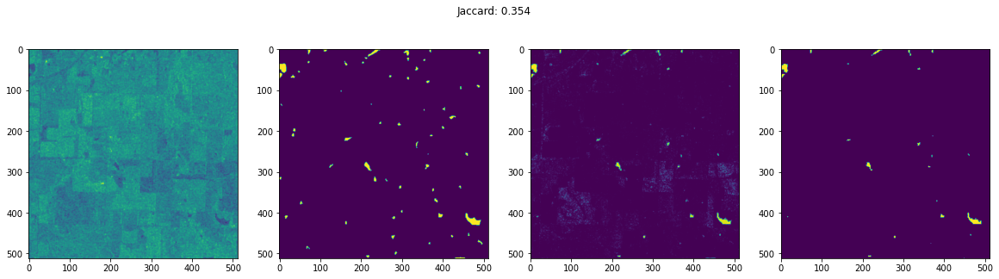

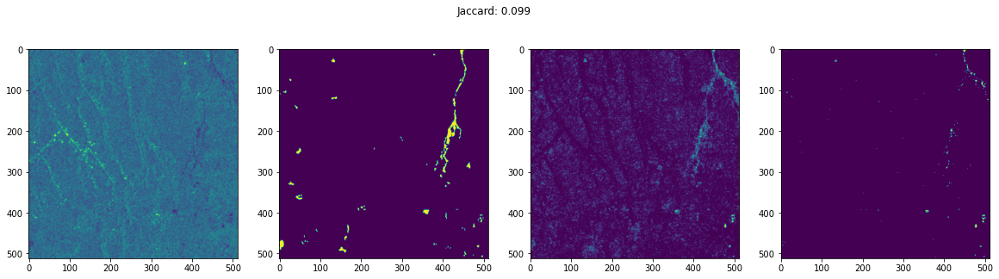

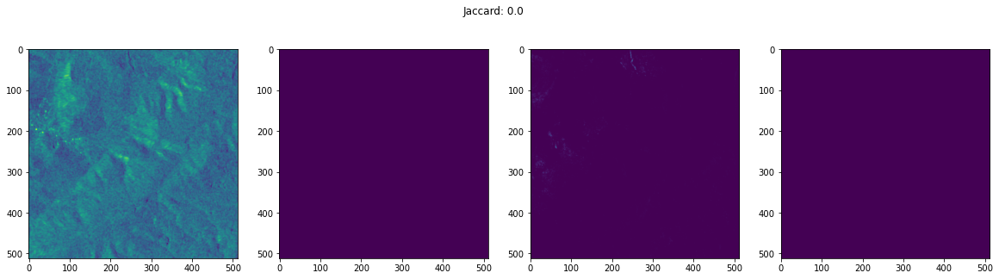

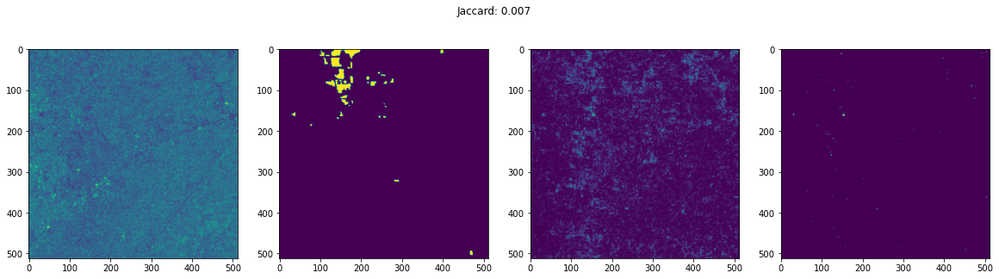

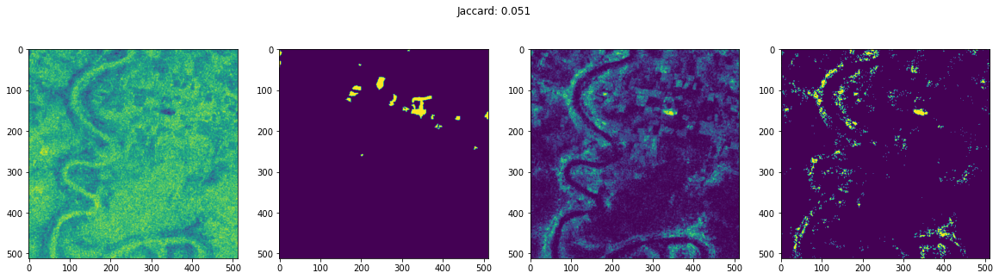

...

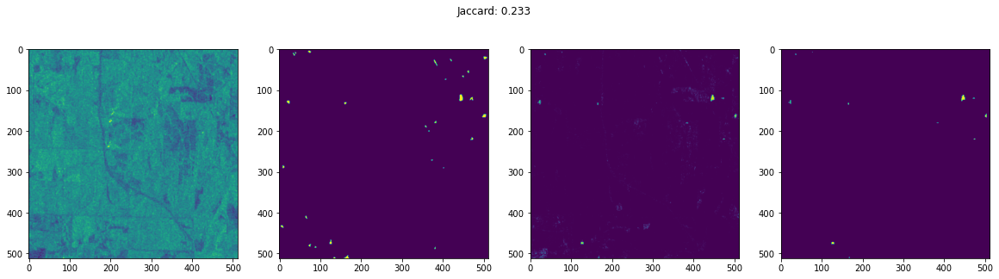

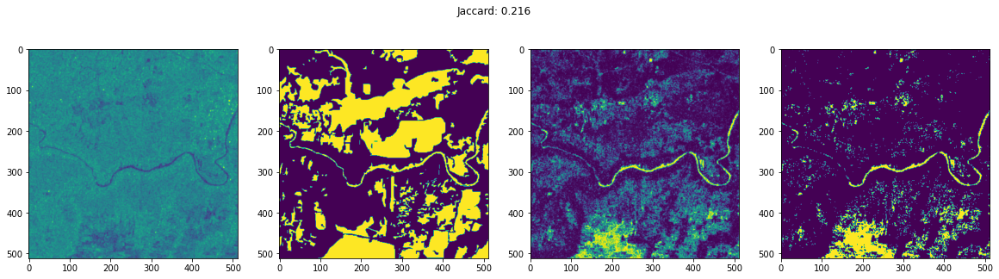

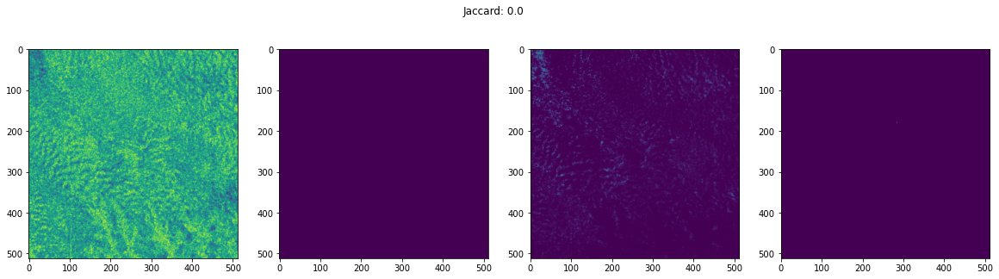

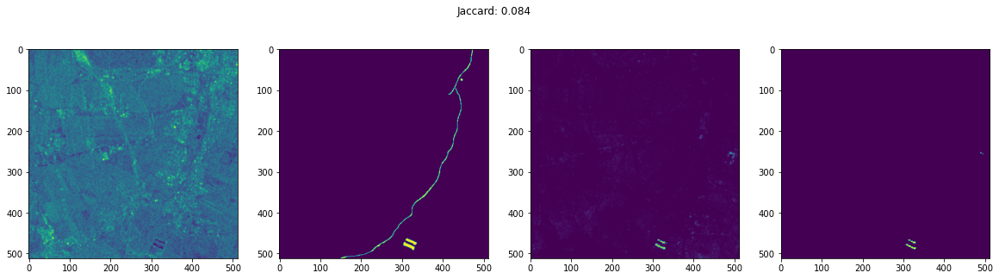

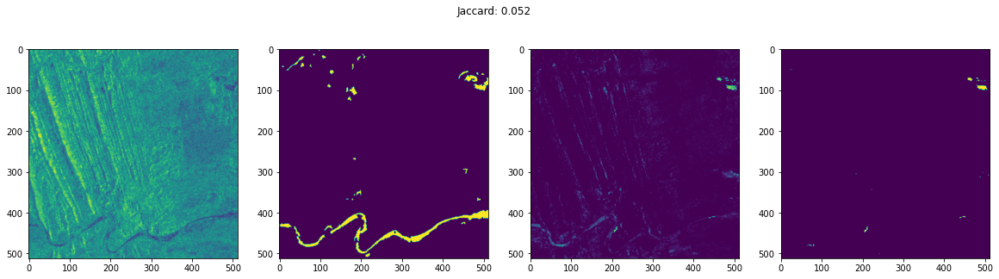

In [60]:
for i in range(20):

    i_low = i * 512*512
    i_up = i_low + 512*512
    
    _, ax = plt.subplots(1, 4, figsize=(20, 5))
    ax[0].imshow(np.array(val['vh'].iloc[i_low:i_up]).reshape((512, 512)))
    ax[1].imshow(np.array(val['y'].iloc[i_low:i_up]).reshape((512, 512)), vmin=0, vmax=1)
    ax[2].imshow(val_preds_agg[i_low:i_up].reshape((512, 512)), vmin=0, vmax=1)
    ax[3].imshow(val_preds_binary[i_low:i_up].reshape((512, 512)), vmin=0, vmax=1)
    plt.suptitle('Jaccard: ' + str(round(jaccard_score(np.array(val['y'].iloc[i_low:i_up]), 
                                                       val_preds_binary[i_low:i_up]), 3)))
    plt.show()

In [61]:
intersection = 0
union = 0
ious = []

for f in tqdm(filenames):
    
    temp = get_one(f)
    
    pred_cat = np.zeros((temp.shape[0], 20))
    
    i = 0
    for models in [models_seq, models_kfold, models_skfold, models_region]:
        for model in models:
            pred_cat[:, i] = model.predict_proba(temp)[:, 1]
            i += 1
            
    pred_cat = np.mean(pred_cat, axis=1).reshape(512, 512)
    pred_cat[pred_cat < 0.5] = 0
    pred_cat[pred_cat >= 0.5] = 1
    
    mask = np.array(temp['y']).reshape((512, 512))

    intersection += np.logical_and(mask, pred_cat).sum()
    union += np.logical_or(mask, pred_cat).sum()
    
    ious.append(intersection / union)

iou = intersection / union

100%|██████████| 542/542 [11:08<00:00,  1.23s/it]


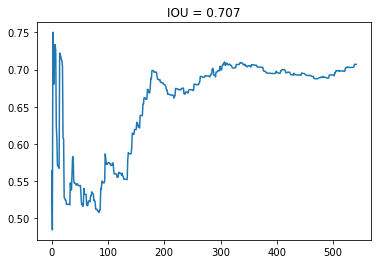

In [62]:
plt.plot(ious)
plt.title('IOU = ' + str(round(iou, 3)))
plt.show()

# Save some predictions to compare and combine them with CatBoost predictions

In [ ]:
Path("result_for_compare").mkdir(parents=True, exist_ok=True)

In [65]:
compare_df = pd.read_csv('compare_df.csv')

compare_paths = []

for f in tqdm(compare_df.files.values):
    
    temp = get_one(f)
    
    pred_cat = np.zeros((temp.shape[0], 20))
    
    i = 0
    for models in [models_seq, models_kfold, models_skfold, models_region]:
        for model in models:
            pred_cat[:, i] = model.predict_proba(temp)[:, 1]
            i += 1
            
    pred_cat = np.mean(pred_cat, axis=1).reshape(512, 512)
    pred_cat[pred_cat < 0.5] = 0
    pred_cat[pred_cat >= 0.5] = 1
    
    compare_paths.append('result_for_compare/cat_'+f)
    np.save('result_for_compare/cat_'+f, pred_cat)
    
compare_df['cat_path'] = compare_paths
compare_df.to_csv('compare_df.csv', index=False)

100%|██████████| 20/20 [00:24<00:00,  1.23s/it]
